# Homography calculation between two images using RANSAC


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import random

In [2]:
#Import image and preprocess image
def get_image(fpath):
    
    # Read image
    img = cv2.imread(fpath)
    
    img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY) 
    #Convert to RGB
    
    img_rgb = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    return img_gray, img_rgb


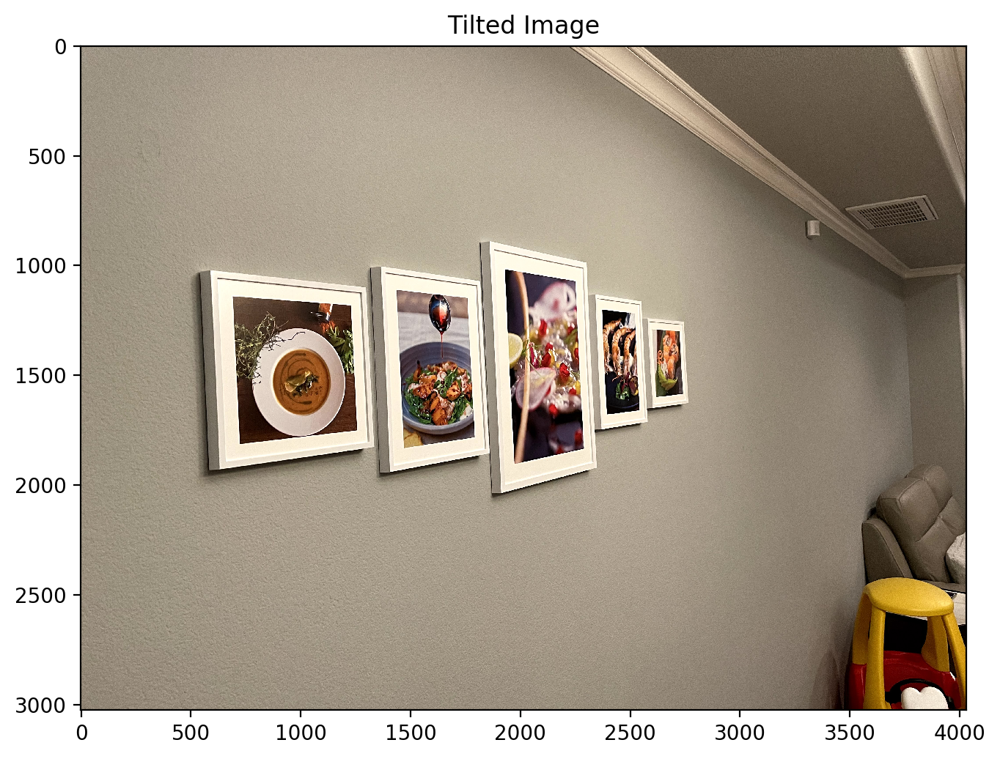

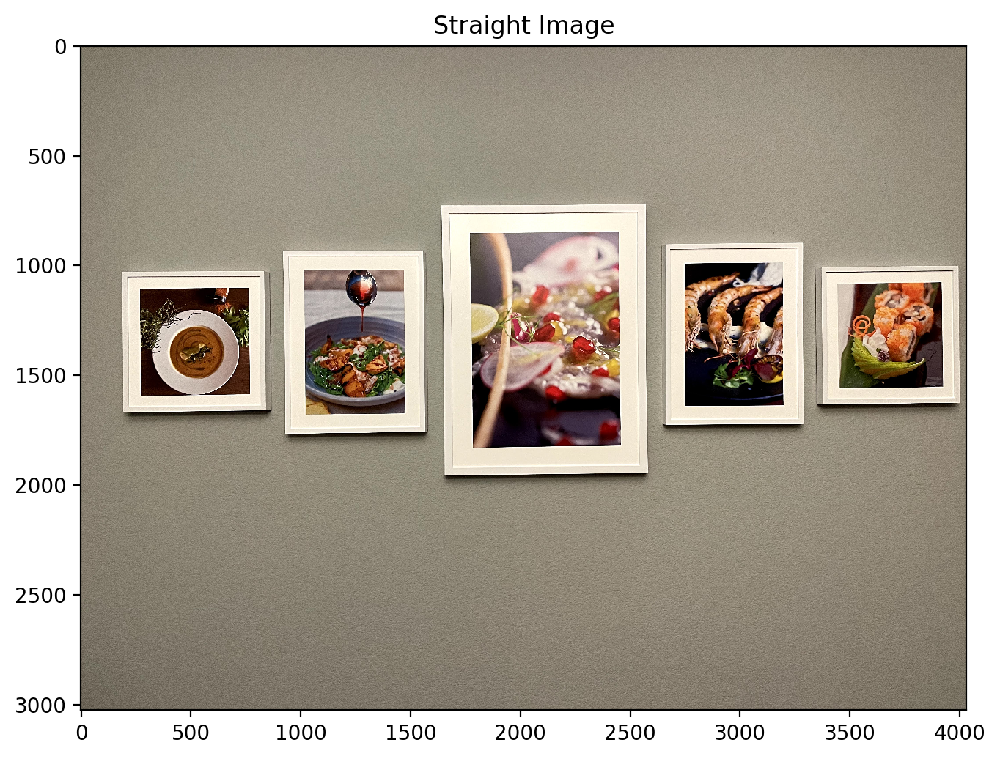

In [3]:
# Load the two images
img1_gray, img1_rgb = get_image("test_images/img1.jpg")
img2_gray, img2_rgb = get_image("test_images/img2.jpg")

#Show images
figure(figsize=(8, 6), dpi=200)
plt.imshow(img1_rgb)
plt.title("Tilted Image")
plt.show()
figure(figsize=(8, 6), dpi=200)
plt.imshow(img2_rgb)
plt.title("Straight Image")
plt.show()


In [4]:
# Get featueres using ORB features
def findFeatures(img):
    print("Finding features in the image")
    algo = cv2.ORB_create(nfeatures=1000)
    keypoints,descriptors = algo.detectAndCompute(img, None)
    
    img = cv2.drawKeypoints(img,keypoints,img,color=(255,0,0))
    figure(figsize=(8, 6), dpi=200)
    plt.imshow(img,cmap='gray')
    plt.title("Keypoints Image")
    plt.show()
    return keypoints, descriptors


In [5]:
# Match features
def matchFeatures(kp1, kp2, desc1, desc2, img1, img2):
    print("Matching features in images")
    matcher = cv2.BFMatcher(cv2.NORM_HAMMING,True)
    matches = matcher.match(desc1, desc2)
    matches = sorted(matches, key=lambda x: x.distance)
    
    #print(matches)


    matchImg = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    figure(figsize=(16, 12), dpi=200)
    plt.imshow(matchImg,cmap='gray')
    plt.title("Matched Image")
    plt.show()
    
    return matches


In [6]:
#
#Calculate the geometric distance between estimated points and original points
#
def geometricDistance(correspondence, h):

    p1 = np.transpose(np.matrix([correspondence[0].item(0), correspondence[0].item(1), 1]))
    estimatep2 = np.dot(h, p1)
    estimatep2 = (1/estimatep2.item(2))*estimatep2

    p2 = np.transpose(np.matrix([correspondence[0].item(2), correspondence[0].item(3), 1]))
    error = p2 - estimatep2
    return np.linalg.norm(error)


#
#Runs through ransac algorithm, creating homographies from random correspondences
#
def ransac(corr, thresh):
    maxInliers = []
    finalH = None
    maxIter = 1000
    for i in range(maxIter):
        if(i%100 == 0):
            print("Running RANSAC iteration: {}/{}...".format(i,maxIter) )
            
        #find 4 random points to calculate a homography
        corr1 = corr[random.randrange(0, len(corr))]
        corr2 = corr[random.randrange(0, len(corr))]
        randomFour = np.vstack((corr1, corr2))
        corr3 = corr[random.randrange(0, len(corr))]
        randomFour = np.vstack((randomFour, corr3))
        corr4 = corr[random.randrange(0, len(corr))]
        randomFour = np.vstack((randomFour, corr4))

        #call the homography function on those points
        h = calculateHomography(randomFour)
        inliers = []

        for i in range(len(corr)):
            d = geometricDistance(corr[i], h)
            if d < 5:
                inliers.append(corr[i])

        if len(inliers) > len(maxInliers):
            maxInliers = inliers
            finalH = h
        #print("Corr size: ", len(corr), " NumInliers: ", len(inliers), "Max inliers: ", len(maxInliers))

        if len(maxInliers) > (len(corr)*thresh):
            break
    return finalH, maxInliers


#
# Computers a homography from 4-correspondences
#
def calculateHomography(correspondences):
    #loop through correspondences and create assemble matrix
    aList = []
    for corr in correspondences:
        p1 = np.matrix([corr.item(0), corr.item(1), 1])
        p2 = np.matrix([corr.item(2), corr.item(3), 1])

        a2 = [0, 0, 0, -p2.item(2) * p1.item(0), -p2.item(2) * p1.item(1), -p2.item(2) * p1.item(2),
              p2.item(1) * p1.item(0), p2.item(1) * p1.item(1), p2.item(1) * p1.item(2)]
        a1 = [-p2.item(2) * p1.item(0), -p2.item(2) * p1.item(1), -p2.item(2) * p1.item(2), 0, 0, 0,
              p2.item(0) * p1.item(0), p2.item(0) * p1.item(1), p2.item(0) * p1.item(2)]
        aList.append(a1)
        aList.append(a2)

    matrixA = np.matrix(aList)

    #svd composition
    u, s, v = np.linalg.svd(matrixA)
    

    #reshape the min singular value into a 3 by 3 matrix
    h = np.reshape(v[8], (3, 3))

    #normalize and now we have h
    h = (1/h.item(8)) * h
    return h



Finding features in the image


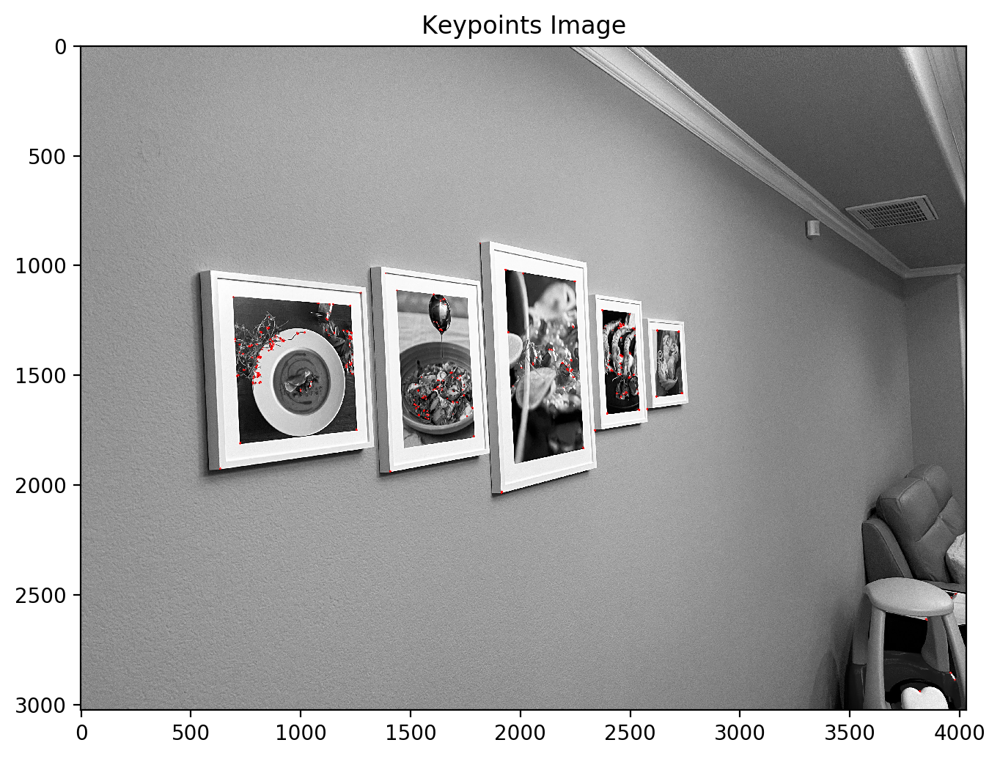

Finding features in the image


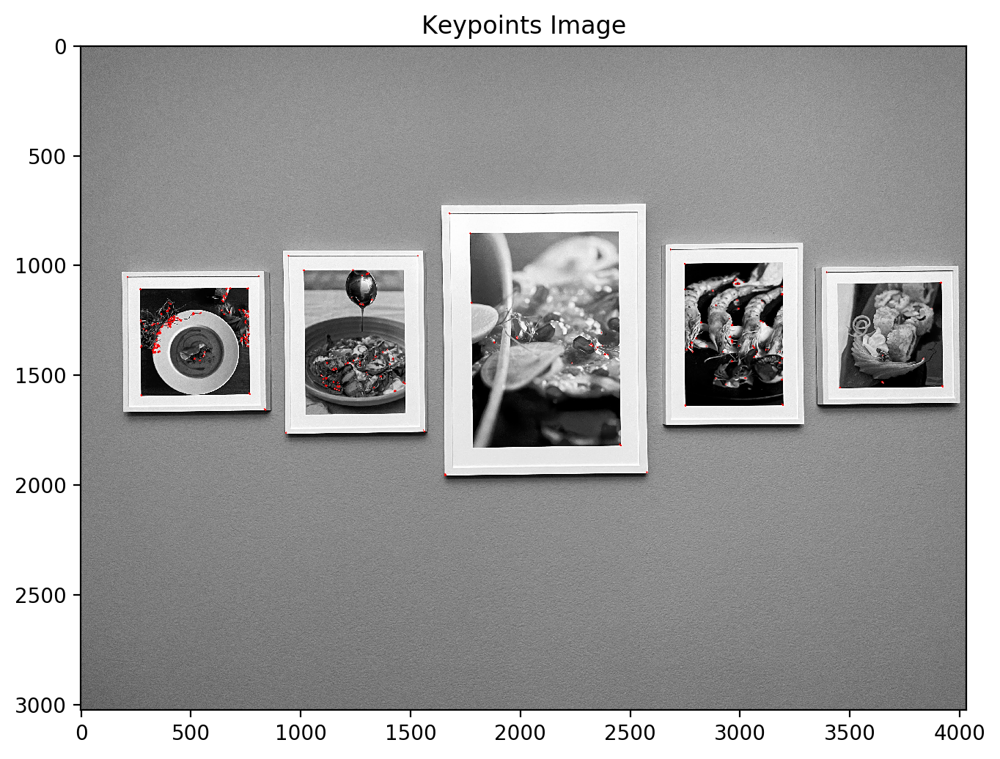

Found keypoints in img1: 1000
Found keypoints in img2: 1000
Matching features in images


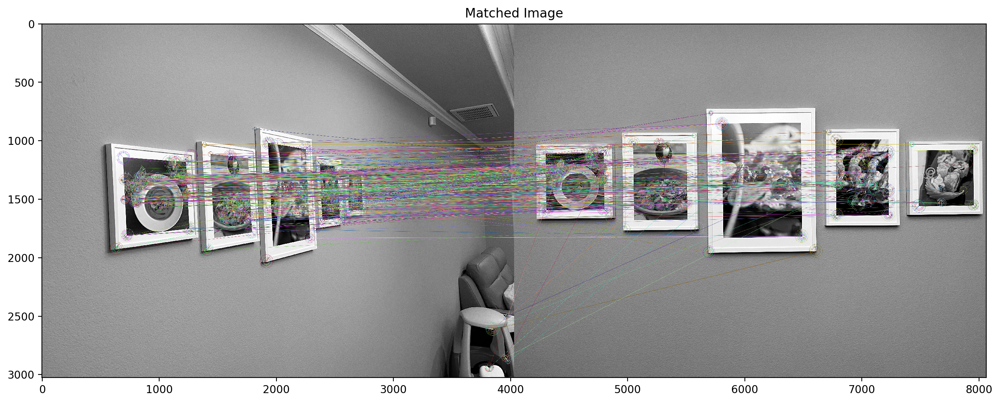

In [7]:
 #find features and keypoints
correspondenceList = []
if img1_gray is not None and img2_gray is not None:
    kp1, desc1 = findFeatures(img1_gray)
    kp2, desc2 = findFeatures(img2_gray)
    print("Found keypoints in img1: " + str(len(kp1)))
    print("Found keypoints in img2: " + str(len(kp2)))
    keypoints = [kp1,kp2]
    matches = matchFeatures(kp1, kp2, desc1, desc2, img1_gray, img2_gray)
    for match in matches:
        (x1, y1) = keypoints[0][match.queryIdx].pt
        (x2, y2) = keypoints[1][match.trainIdx].pt
        correspondenceList.append([x1, y1, x2, y2])

    corrs = np.matrix(correspondenceList)
    
    


In [ ]:
#run ransac algorithm
estimation_thresh = 0.8
finalH, inliers = ransac(corrs, estimation_thresh)
#print(inliers)



Running RANSAC iteration: 0/1000...
Running RANSAC iteration: 100/1000...
Running RANSAC iteration: 200/1000...
Running RANSAC iteration: 300/1000...
Running RANSAC iteration: 400/1000...
Running RANSAC iteration: 500/1000...
Running RANSAC iteration: 600/1000...


In [ ]:
print("Final homography: ", finalH)
print("Final inliers count: ", len(inliers))


In [ ]:
#matchImg = cv2.drawMatches(img1,kp1,img2,kp2,inliers,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
maxHeight, maxWidth  = img1_gray.shape
print("img1_gray.shape is : " + str(img1_gray.shape))

warped = cv2.warpPerspective(img1_rgb, finalH, (int(np.floor(1.0*maxWidth)), int(np.floor(0.7*maxHeight))))

figure(figsize=(8, 6), dpi=200)
plt.imshow(img1_rgb)
plt.title("Original Image")
#plt.show()

figure(figsize=(8, 6), dpi=200)
plt.imshow(warped)
plt.title("Warped Image")
#plt.show()

figure(figsize=(8, 6), dpi=200)
plt.imshow(img2_rgb)
plt.title("Original Image")
plt.show()
